In [44]:
import numpy as np
import xarray as xr
from matplotlib import pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (20,15)

In [3]:
ds = xr.open_dataset('../data/freeboard_20120925_f2.nc')
ds

<xarray.Dataset>
Dimensions:  (ndata: 58576955)
Dimensions without coordinates: ndata
Data variables:
    lat      (ndata) float64 ...
    lon      (ndata) float64 ...
    h        (ndata) float32 ...
    jtime    (ndata) timedelta64[ns] ...
Attributes:
    title:             Sea-ice freeboard from RAPPLS lidar observations
    history:           created by user hylandg on Thu Feb 28 14:23:44 2019
    lidar_file:        lidar_20120925_f2.nc
    corrections_file:  baseline_20120925_f2.nc
    meta_data_record:  http://data.aad.gov.au/metadata/records/RAPPLS_TotalFr...
    parent_record:     http://data.aad.gov.au/metadata/records/SIPEX_II_RAPPLS
    cruise:            SIPEX2012 (East Antarctica)
    vessel:            R.V. Aurora Australis
    start_date_time:   2012-09-25T06:05:56Z

In [3]:
ds1000 = ds.isel(ndata = np.arange(1000))
ds100 = ds.isel(ndata = np.arange(100))

In [4]:
df1000  = pd.DataFrame({'lat': ds.lat.values[:1000],
                   'lon': ds.lon.values[:1000],
                   'h': ds.h.values[:1000]})
df1000

,lat,lon,h
0,-63.744772,119.411622,0.335764
1,-63.744768,119.411594,0.365765
2,-63.744764,119.411569,0.165764
3,-63.744760,119.411538,0.425764
4,-63.744756,119.411510,0.495764
...,...,...,...
995,-63.744199,119.407542,0.435749
996,-63.744196,119.407521,0.485748
997,-63.744192,119.407501,0.465750
998,-63.744189,119.407480,0.395750


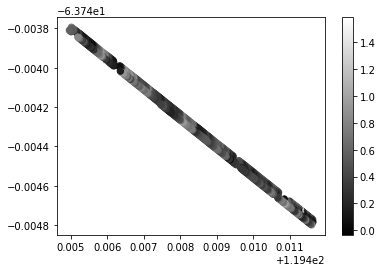

In [5]:
fig, ax = plt.subplots()
im = plt.scatter(x=df1000.lon, y=df1000.lat, c=df1000.h, s=40, cmap='gray')
fig.colorbar(im, ax=ax)

In [4]:
df = pd.DataFrame({'lat': ds.lat.values,
                   'lon': ds.lon.values,
                   'h': ds.h.values})
df

,lat,lon,h
0,-63.744772,119.411622,0.335764
1,-63.744768,119.411594,0.365765
2,-63.744764,119.411569,0.165764
3,-63.744760,119.411538,0.425764
4,-63.744756,119.411510,0.495764
...,...,...,...
58576950,-63.879624,119.915708,-0.333864
58576951,-63.879617,119.915733,-0.293863
58576952,-63.879610,119.915757,-0.113865
58576953,-63.879602,119.915784,-0.263865


In [5]:
df_diff = df.diff()
df['d'] = (df_diff['lat']**2+df_diff['lon']**2)**0.5
df['grad'] = df_diff['h']/df['d']
df

,lat,lon,h,d,grad
0,-63.744772,119.411622,0.335764,NaN,NaN
1,-63.744768,119.411594,0.365765,0.000028,1063.076482
2,-63.744764,119.411569,0.165764,0.000026,-7824.060967
3,-63.744760,119.411538,0.425764,0.000031,8474.582105
4,-63.744756,119.411510,0.495764,0.000028,2478.622265
...,...,...,...,...,...
58576950,-63.879624,119.915708,-0.333864,0.000026,1550.143952
58576951,-63.879617,119.915733,-0.293863,0.000026,1527.039942
58576952,-63.879610,119.915757,-0.113865,0.000025,7318.421126
58576953,-63.879602,119.915784,-0.263865,0.000028,-5314.928905


(0.0, 100.0)

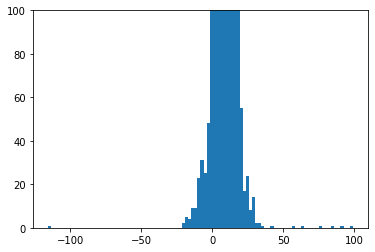

In [9]:
fig, ax = plt.subplots()
plt.hist(df.h, bins=100)
ax.set_ylim((0,1e2))

(0.0, 100.0)

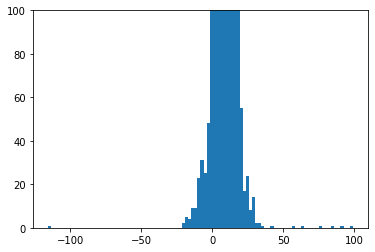

In [14]:
fig, ax = plt.subplots()
plt.hist(df.h, bins=100)
ax.set_ylim((0,1e2))

(0.0, 1000.0)

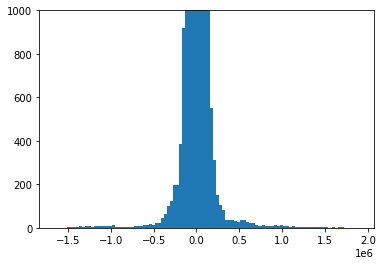

In [6]:
fig, ax = plt.subplots()
plt.hist(df.grad, bins=100)
ax.set_ylim((0,1e3))

In [7]:
biggrads_df = df.where(abs(df.grad) > 0.5e6).dropna()
biggrads_df

,lat,lon,h,d,grad
1449015,-63.799331,119.367181,2.846542,0.000001,1.894442e+06
2229287,-63.830142,119.350446,0.153088,0.000004,-5.621365e+05
3651922,-63.881288,119.312389,0.564674,0.000003,-1.109202e+06
3652223,-63.881294,119.312373,0.584665,0.000002,-1.409707e+06
9646447,-64.098447,119.154115,36.375805,0.000064,5.680441e+05
...,...,...,...,...,...
56693807,-63.876936,119.917866,8.761333,0.000004,-9.234495e+05
56694701,-63.876705,119.917273,0.201250,0.000012,-1.342032e+06
56694961,-63.876906,119.917675,5.741220,0.000006,-5.612650e+05
56695268,-63.876811,119.917440,0.281193,0.000006,-1.151111e+06


In [43]:
ind = 50
index_range = range(biggrads_df.index[ind] - 100, biggrads_df.index[ind] + 100)
plot_df = df.iloc[index_range]

In [44]:
plot_df['rel_d'] = plot_df.d.cumsum()
plot_df

/srv/scratch/z3289452/miniconda3/envs/OceanDataScience/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,lat,lon,h,d,grad,rel_d
30976513,-64.800947,120.215504,0.197666,0.000018,0.000000,0.000018
30976514,-64.800951,120.215486,0.277666,0.000018,4349.185818,0.000037
30976515,-64.800956,120.215468,0.337666,0.000018,3298.450745,0.000055
30976516,-64.800961,120.215451,0.327665,0.000018,-543.270652,0.000073
30976517,-64.800966,120.215433,0.367666,0.000018,2174.642775,0.000092
...,...,...,...,...,...,...
30976708,-64.800441,120.217424,0.327671,0.000020,1493.110494,0.010140
30976709,-64.800445,120.217405,0.147671,0.000019,-9363.619436,0.010159
30976710,-64.800451,120.217386,0.107672,0.000020,-2033.471248,0.010178
30976711,-64.800456,120.217367,0.077671,0.000020,-1510.492311,0.010198


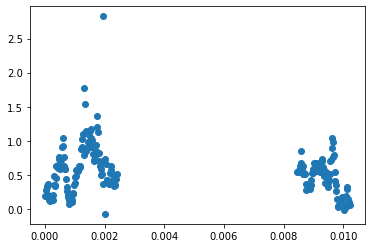

In [45]:
fig, ax = plt.subplots()
ax.scatter(plot_df['rel_d'], plot_df['h'])

(0.0, 100.0)

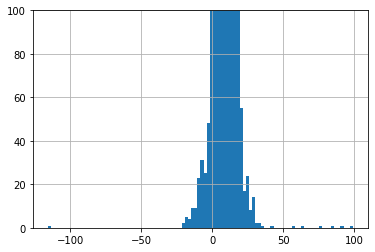

In [27]:
df.h.hist(bins=100)
plt.ylim((0,1e2))

In [25]:
df.h.min()

-115.33036

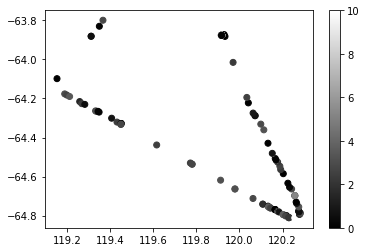

In [31]:
fig, ax = plt.subplots()
im = plt.scatter(x=plot_df.lon, y=plot_df.lat, c=plot_df.h, cmap='gray', vmin=0, vmax=10)
fig.colorbar(im, ax=ax)

## Images

In [2]:
from imageio import imread
from skimage import io,segmentation,future,color,data,feature,measure,morphology,filters,util,restoration

/srv/scratch/z3289452/miniconda3/envs/OceanDataScience/lib/python3.7/site-packages/skimage/io/manage_plugins.py:23: UserWarning: Your installed pillow version is < 7.1.0. Several security issues (CVE-2020-11538, CVE-2020-10379, CVE-2020-10994, CVE-2020-10177) have been fixed in pillow 7.1.0 or higher. We recommend to upgrade this library.
  from .collection import imread_collection_wrapper


In [3]:
im = imread('../data/20120925_f2_1060.thumb.ppm')

In [4]:
im.shape

(764, 1020, 3)

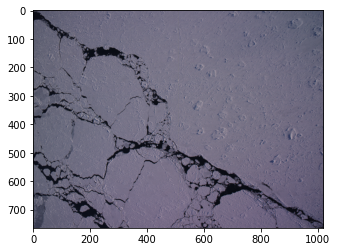

In [5]:
plt.imshow(im)

In [6]:
grayim = color.rgb2gray(im)

In [17]:
contours = measure.find_contours(grayim,level=0.1)

NameError: name 'grayim' is not defined

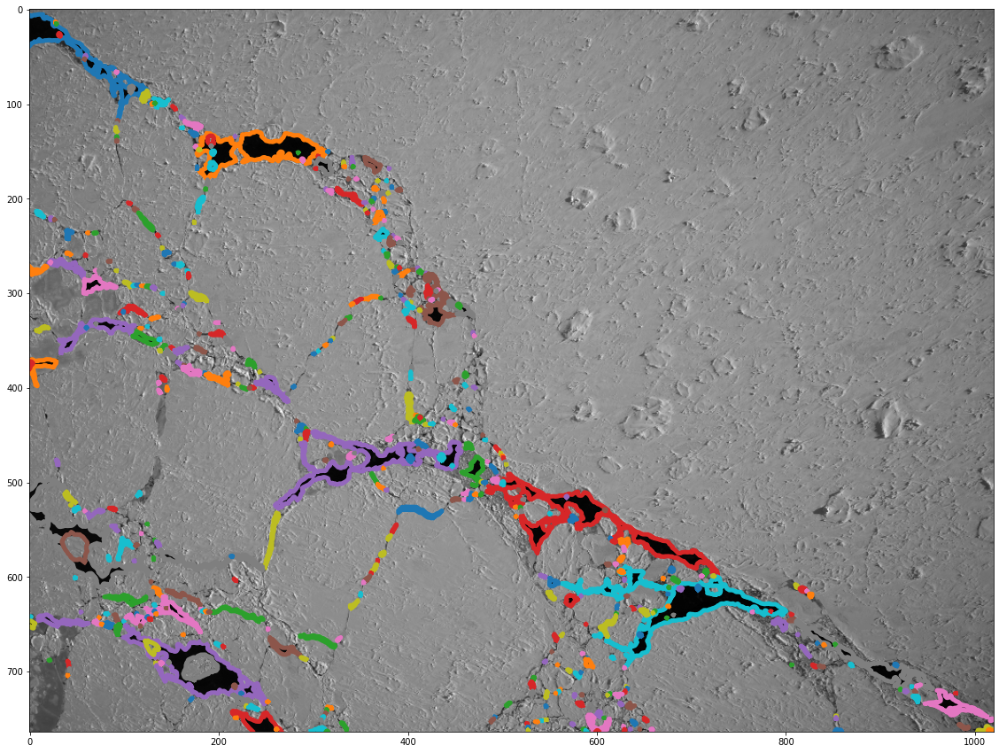

In [27]:
fig, ax = plt.subplots(figsize=(20,15))
ax.imshow(grayim, cmap='gray')
for n,contour in enumerate(contours):
    ax.plot(contour[:,1],contour[:,0],lw=5)

In [28]:
sobel_edges = filters.sobel(grayim)
roberts_edges = filters.roberts(grayim)

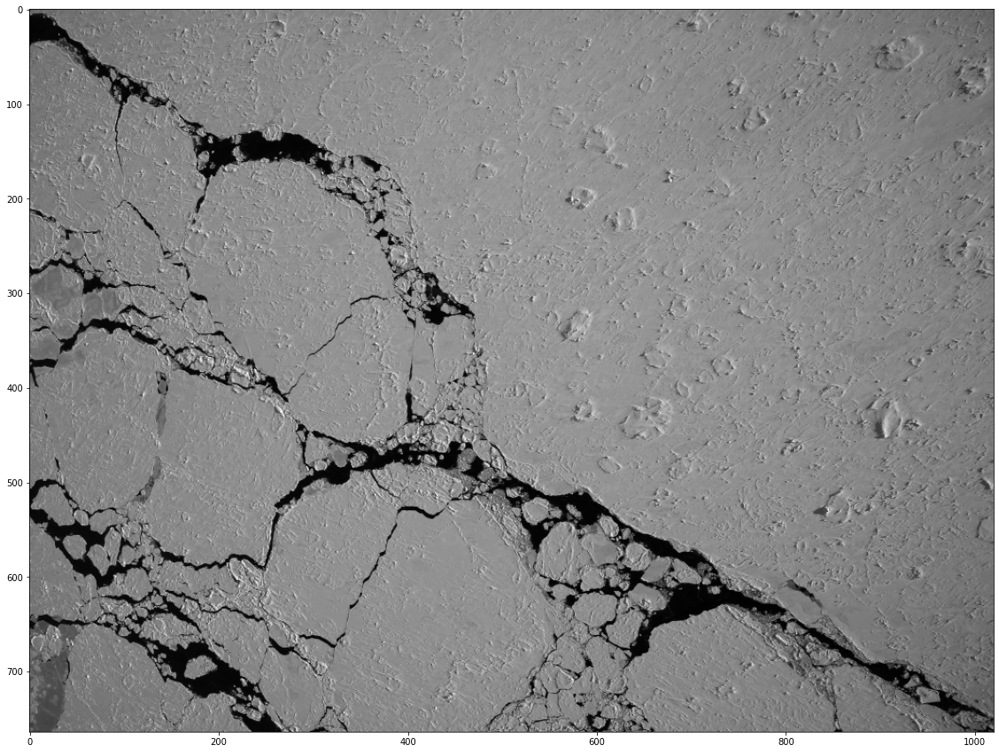

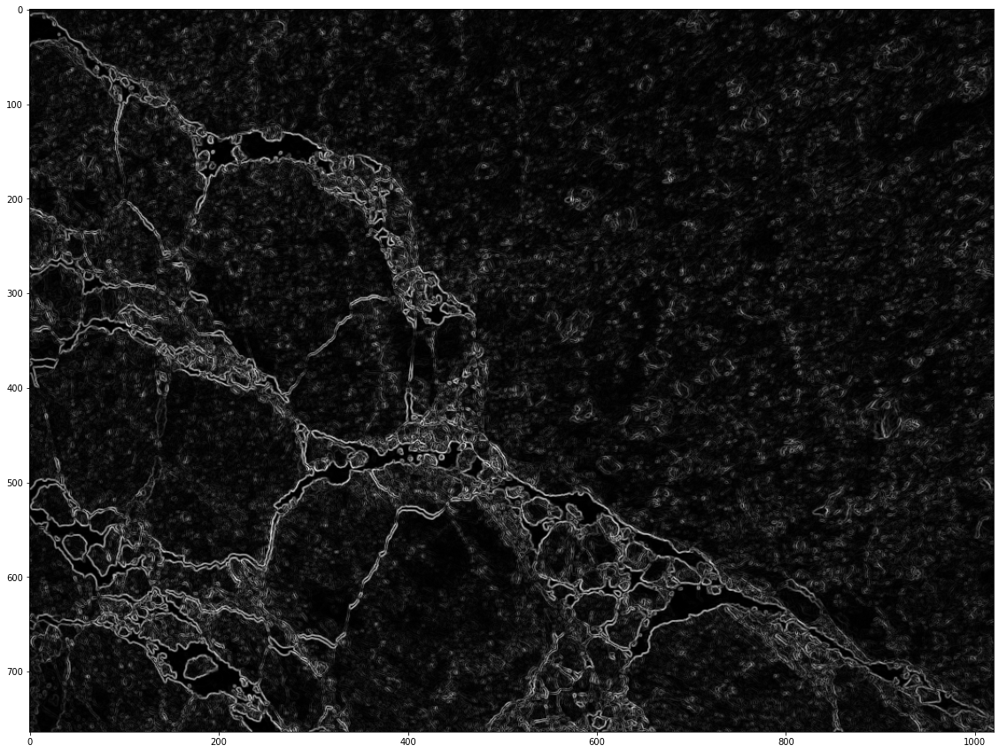

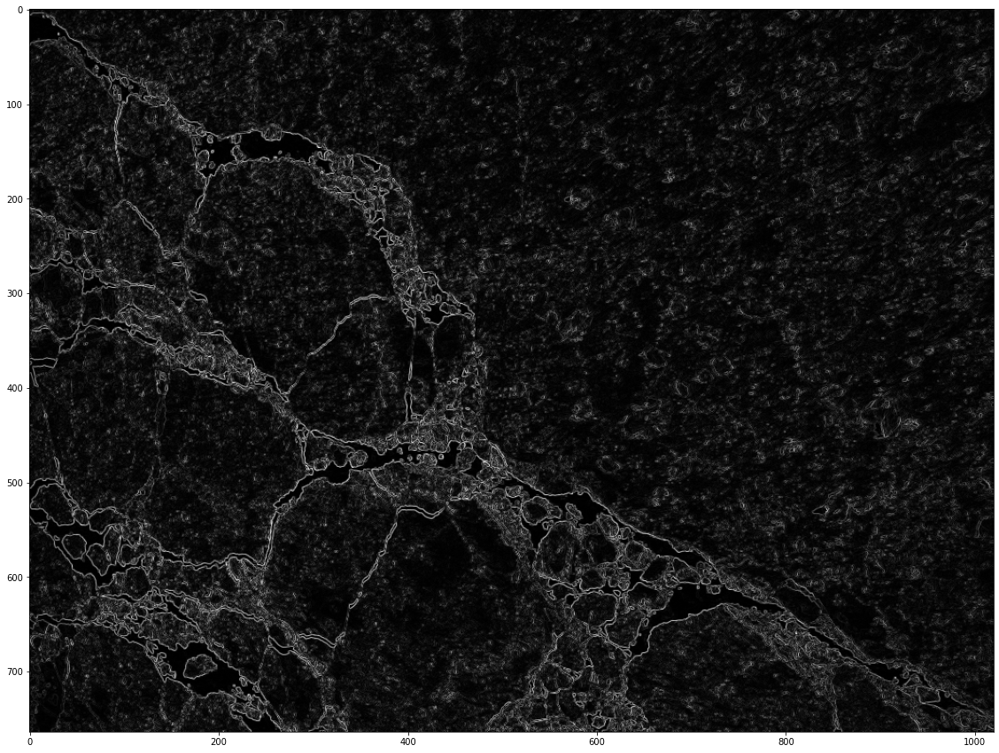

In [32]:
fig, ax = plt.subplots()
plt.imshow(grayim, cmap='gray')

fig, ax = plt.subplots()
plt.imshow(sobel_edges, cmap='gray')

fig, ax = plt.subplots()
plt.imshow(roberts_edges, cmap='gray')


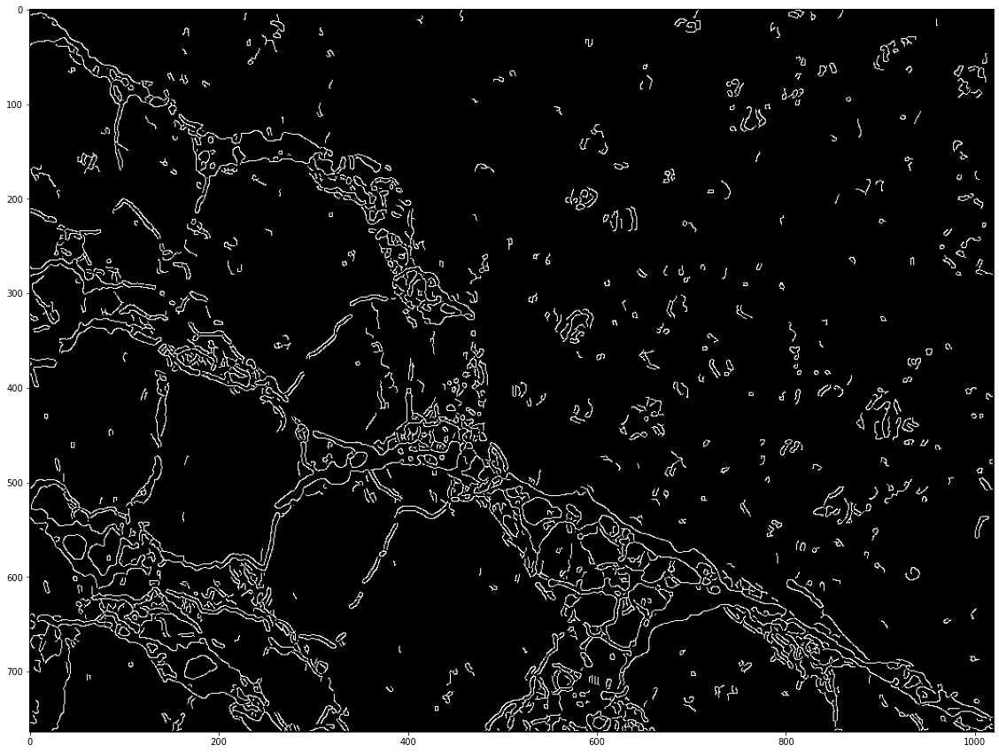

In [40]:
canny = feature.canny(grayim,sigma=1.5)
plt.imshow(canny, cmap='gray')

In [41]:
grayinv = util.invert(grayim)
thresh_gray= filters.threshold_otsu(grayim)
thresh_invert = filters.threshold_otsu(grayinv)

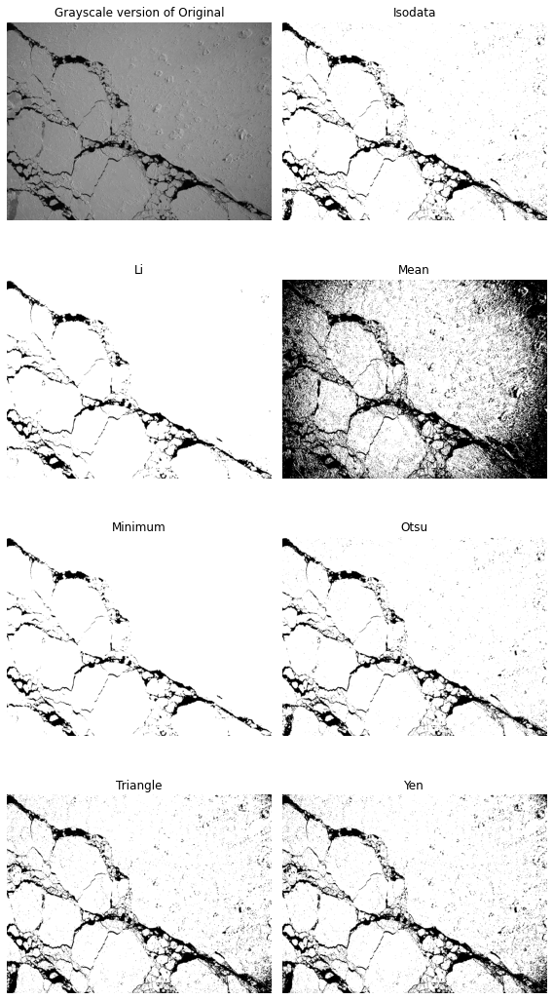

In [43]:
f,ax = filters.try_all_threshold(grayim,verbose=False,figsize=(8,15))
_ = ax[0].set_title('Grayscale version of Original')

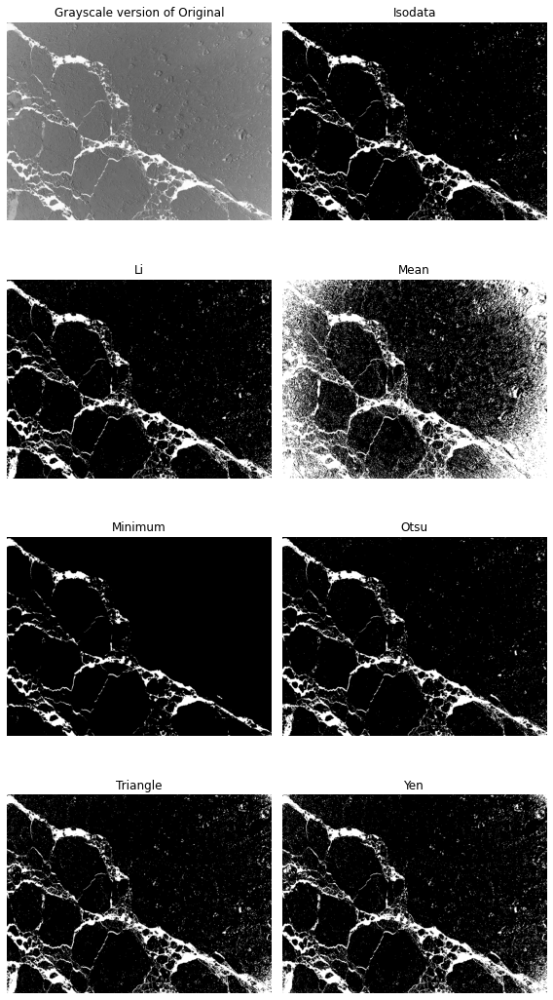

In [44]:
f,ax = filters.try_all_threshold(grayinv,verbose=False,figsize=(8,15))
_ = ax[0].set_title('Grayscale version of Original')

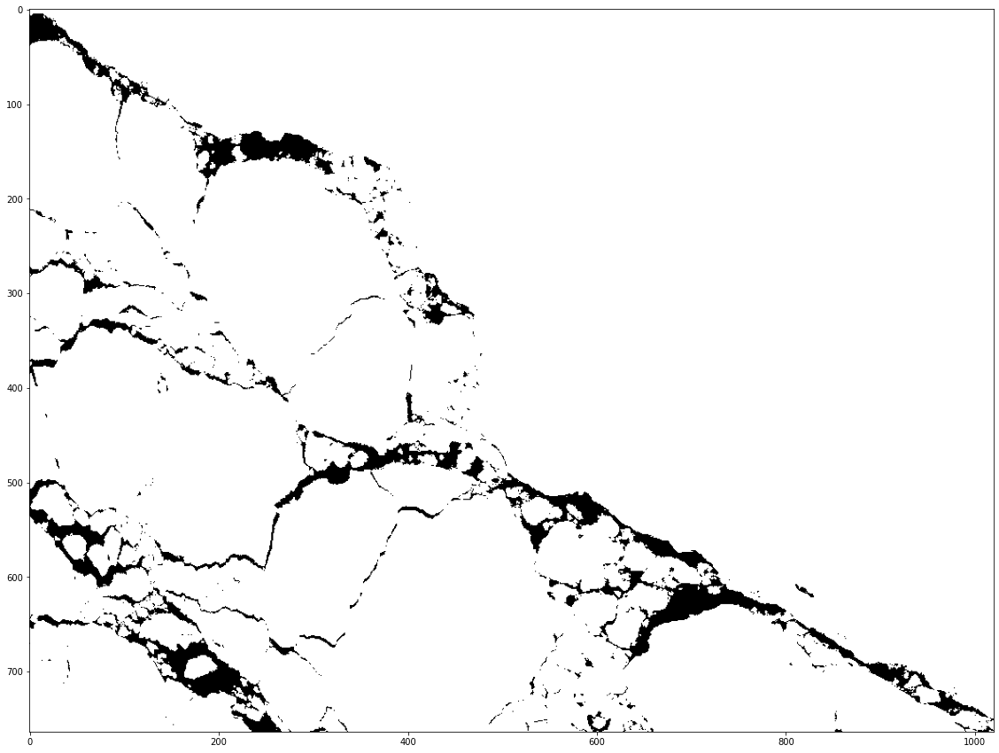

In [46]:
thresh = filters.threshold_minimum(grayinv)
binary_invert = grayinv < thresh
plt.imshow(binary_invert,cmap='gray')

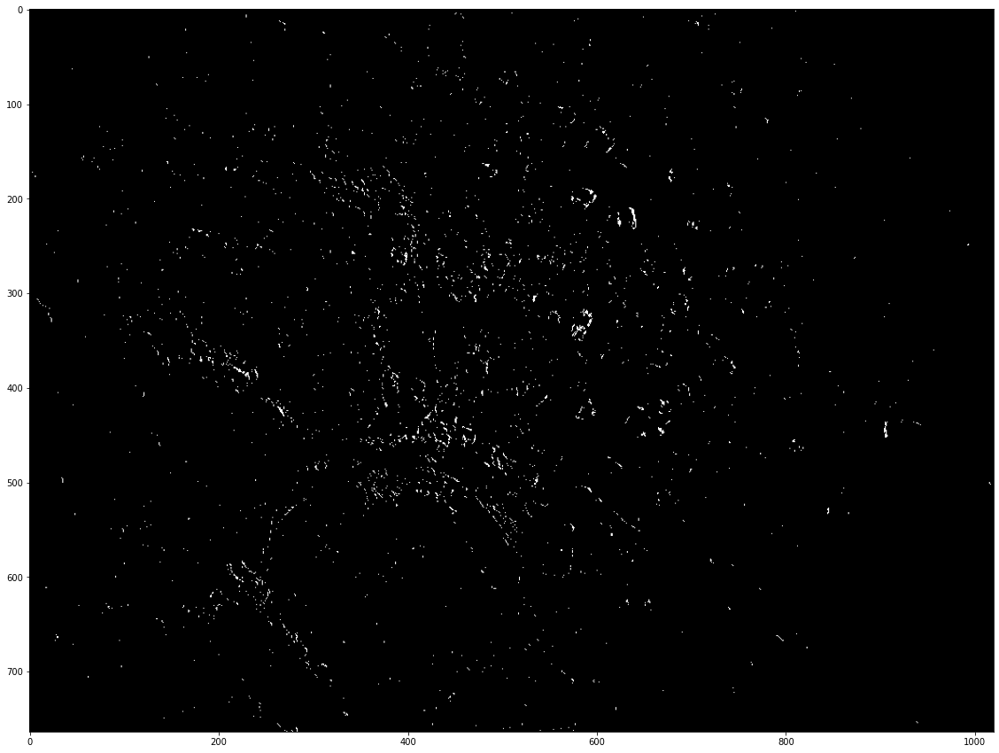

In [52]:
thresh = filters.threshold_local(grayim, block_size=1023)
binary_invert = grayinv < thresh
plt.imshow(binary_invert,cmap='gray')

### Clustering algorithms with Sklearn 

In [7]:
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering, Birch
from sklearn_extra.cluster import KMedoids

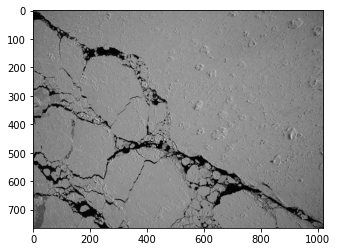

In [18]:
plt.imshow(grayim, cmap='gray')

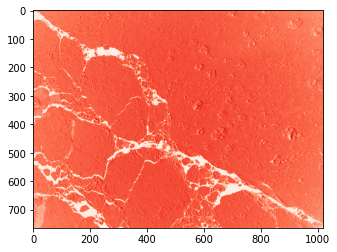

In [19]:
plt.imshow(im[:,:,0], cmap='Reds')

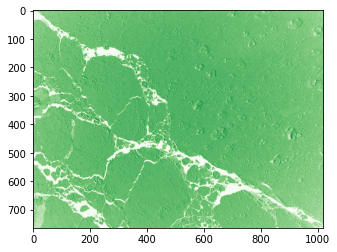

In [20]:
plt.imshow(im[:,:,1], cmap='Greens')

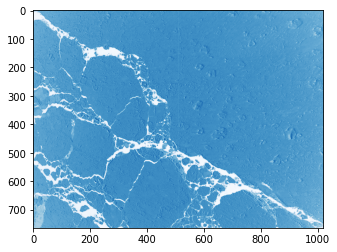

In [21]:
plt.imshow(im[:,:,2], cmap='Blues')

In [38]:
grayim.shape

(764, 1020)

In [17]:
imasdf = np.array([[[i,j,grayim[i,j]] for j in range(grayim.shape[1])] for i in range(grayim.shape[0])])

In [39]:
imasdf = grayim.flatten().reshape((764*1020,1)) 

In [25]:
imasdf = imasdf.reshape(-1, imasdf.shape[-1])

array([[0.        , 0.        , 0.30062078],
       [0.        , 1.        , 0.31797373],
       [0.        , 2.        , 0.32106196],
       [0.        , 3.        , 0.31521373],
       [0.        , 4.        , 0.3263902 ],
       [0.        , 5.        , 0.34264196],
       [0.        , 6.        , 0.35494235],
       [0.        , 7.        , 0.34261216],
       [0.        , 8.        , 0.37233294],
       [0.        , 9.        , 0.36532314]])

In [46]:
KMeans_out = KMeans(n_clusters=2).fit(imasdf).labels_

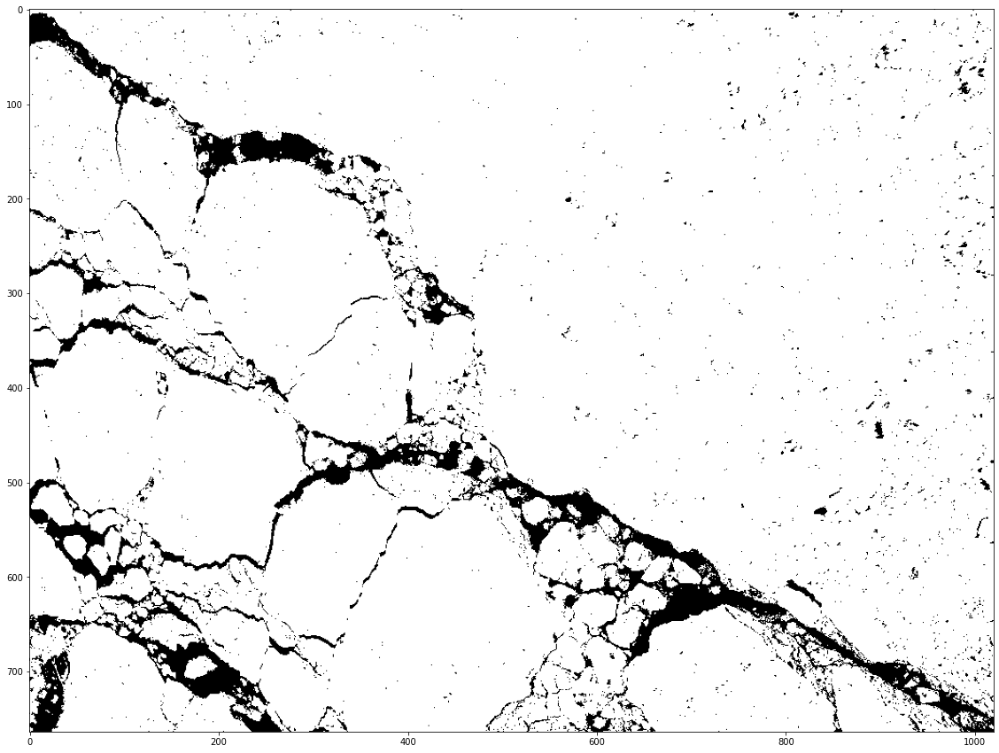

In [47]:
plt.imshow(KMeans_out.reshape(grayim.shape), cmap='gray')

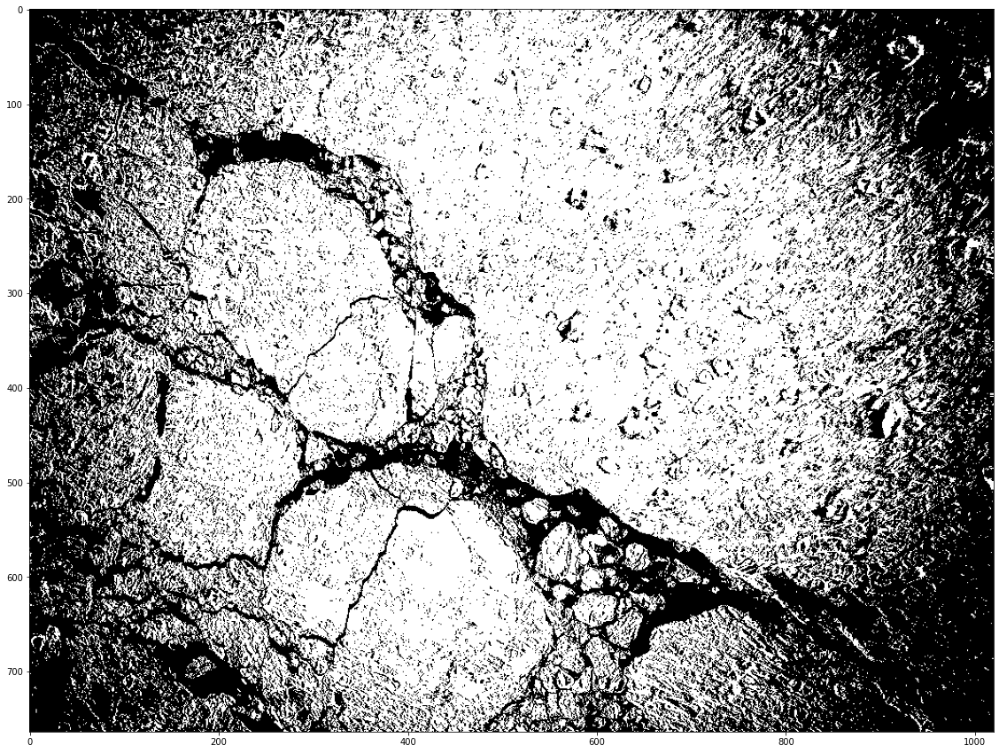

In [56]:
Birch_out = Birch(n_clusters=2,threshold=0.001).fit(imasdf).labels_
plt.imshow(Birch_out.reshape(grayim.shape), cmap='gray')


## GPX file to get gps coordinates

In [4]:
import gpxpy

In [5]:
gpx_file = open('../data/20120925_f2.gpx', 'r')
gpx = gpxpy.parse(gpx_file)

In [6]:
len(gpx.tracks[0].segments[0].points)

949

In [7]:
data = gpx.tracks[0].segments[0].points 

In [9]:
gpxdf = pd.DataFrame(columns=['lon', 'lat', 'elev', 'time'])
for point in data:
    gpxdf = gpxdf.append({'lon': point.longitude, 'lat' : point.latitude, 'elev' : point.elevation, 'time' : point.time}, ignore_index=True)

In [10]:
gpxdf

,lon,lat,elev,time
0,119.916480,-63.887451,25.131714,2012-09-25 05:04:04+00:00
1,119.916372,-63.887472,43.877319,2012-09-25 05:04:15+00:00
2,119.916265,-63.887258,74.158813,2012-09-25 05:04:54+00:00
3,119.916244,-63.887129,60.219727,2012-09-25 05:05:05+00:00
4,119.916244,-63.887150,55.893799,2012-09-25 05:05:12+00:00
...,...,...,...,...
944,119.917467,-63.875713,39.070679,2012-09-25 07:53:13+00:00
945,119.916801,-63.875928,19.844360,2012-09-25 07:53:23+00:00
946,119.916544,-63.876014,8.308594,2012-09-25 07:53:34+00:00
947,119.916480,-63.876057,7.827881,2012-09-25 07:56:39+00:00
